# Imports

In [1]:
from imutils import contours
import numpy as np
import argparse
import imutils
import cv2
import sys
from matplotlib import pyplot as plt

## Dictionary FIRST_NUMBER , which maps the first digit to the corresponding credit card type.

In [2]:
# define a dictionary that maps the first digit of a credit card
# number to the credit card type
FIRST_NUMBER = {
	"3": "American Express",
	"4": "Visa",
	"5": "MasterCard",
	"6": "Discover Card"
}

EXPECTED_PAN_DIGITS = 16  

### List of all The Test cases 

In [3]:
testcases = [
    './testcases/00 - Credit_Card_blank.jpg',
    './testcases/01 - Straightforward.jpg',
    './testcases/02 - You can do it.jpg',
    './testcases/03 - Should be okay.jpg',
    './testcases/04 - Still ok, I hope.jpg',
    './testcases/05 - Looks cool, hope it runs cool too.jpg',
    './testcases/06 - Hatetlewe7 hatlewe7.jpg',
    './testcases/07 - Hatet3eweg hat3eweg.jpg',
    './testcases/08 - Ew3a soba3ak ya3am.jpg',
    './testcases/09 - El spero spathis we23et 3aaaa.jpg',
    './testcases/10 - Mal7 w Felfel.jpg',
    './testcases/11 - Ya setty ew3i.jpg',
    './testcases/12 - weewooweewoo.jpg',
    './testcases/13 - Matozbot el camera ya Kimo.jpg',
    './testcases/14 - 2el noor 2ata3.jpg',
    './testcases/15 - Compresso Espresso.jpg',
    './testcases/16 - Sheel el kart yastaaaa.jpg',
]



## Kernels


In [4]:
# Sharpen the image using a filter
sharpening_kernel1 = np.array([[0, -1, 0],
                                  [-1, 5,-1],
                                  [0, -1, 0]])

# Define the sharpening kernel
sharpening_kernel2 = np.array([[-1, -1, -1],
                              [-1,  9, -1],
                              [-1, -1, -1]])


# structuring kernel
rectKernel = cv2.getStructuringElement(cv2.MORPH_RECT, (9, 3))
# Create a smaller rectangular structuring element with size 5x2
smallRectKernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 2))
sqKernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
smallsqKernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, 1))


## Utils Function


### Show Images Plot 


In [5]:
def show_images(images, titles):
    plt.figure(figsize=(15, 5))
    for i, (imageplace, title) in enumerate(zip(images, titles)):
        plt.subplot(1, len(images), i + 1)
        # imageplace = cv2.cvtColor(imageplace, cv2.COLOR_BGR2GRAY)
        plt.imshow(imageplace   , cmap='gray')
        plt.title(title)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Load The refrence OCR-A image
### - Converting to Greyscale
###  - Thesholding + inverting it

In [6]:
def load_digit_templates(ref_image_path):
    ref = cv2.imread(ref_image_path)
    ref = cv2.cvtColor(ref, cv2.COLOR_BGR2GRAY)
    ref = cv2.threshold(ref, 10, 255, cv2.THRESH_BINARY_INV)[1]
    refCnts = cv2.findContours(ref.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    refCnts = imutils.grab_contours(refCnts)
    refCnts = contours.sort_contours(refCnts, method="left-to-right")[0]
    digits = {}

    for (i, c) in enumerate(refCnts):
        (x, y, w, h) = cv2.boundingRect(c)
        roi = ref[y:y + h, x:x + w]
        roi = cv2.resize(roi, (57, 88))
        digits[i] = roi

    return digits

## Check Rotation


### Order Points of the rectangle 

In [7]:
# Sort corners to identify top-left, top-right, bottom-right, bottom-left
def order_points(pts):
    rect = np.zeros((4, 2), dtype="float32")

    s = pts.sum(axis=1)
    rect[0] = pts[np.argmin(s)]
    rect[2] = pts[np.argmax(s)]

    diff = np.diff(pts, axis=1)
    rect[1] = pts[np.argmin(diff)]
    rect[3] = pts[np.argmax(diff)]

    return rect

### Get card contour

In [8]:
def get_card_contour(image):
    # Find contours in the edges and filter out the card's contour
    contours, _ = cv2.findContours(image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)  # Sort by area

    # Approximate the contour to a polygon and detect corners
    for contour in contours:
        epsilon = 0.02 * cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, epsilon, True)

        if len(approx) == 4:  # If the polygon has 4 vertices, we assume it's the card
            card_corners = approx
            break

    pts = card_corners.reshape(4, 2)
    rect = order_points(pts)

    return rect

## Check Rotation

In [9]:
def Check_Rotation(image , width=400, height=250):

    rect = get_card_contour(image)

    (tl, tr, br, bl) = rect

    # Calculate the angle of tilt based on the line between top-left and top-right corners
    angle = np.arctan2(tr[1] - tl[1], tr[0] - tl[0]) * 180.0 / np.pi

    # Check if the angle deviates significantly from 0 (horizontal)
    is_tilted = angle > 10  # You can adjust this threshold

    return is_tilted, angle

### Correct Rotation

In [10]:
def correct_rotation(edges_input, image_input, width=400, height=250):
    rect = get_card_contour(edges_input)

    # Define the target coordinates for the perspective warp
    dst = np.array([
        [0, 0],
        [width - 1, 0],
        [width - 1, height - 1],
        [0, height - 1]], dtype="float32")

    # Compute the perspective transform matrix and apply it
    M = cv2.getPerspectiveTransform(rect, dst)
    warped = cv2.warpPerspective(image_input, M, (width, height))

    return warped

# Processeing the image

In [11]:
# load the input image, resize it, and convert it to grayscale
def preprocess_image(image_path , resize_width=300):
    image_out = image_path
    image_out = imutils.resize(image_out, width=300)
    # gray_out = image_path
    image_out = cv2.GaussianBlur(image_out, (3, 3), 0)
    show_images([gray,image_out], ['gray','Preprocessed Image'])
    return image_out
    # return image_out, gray_out

## Morphological Operations 


In [12]:
def apply_morphological_operations(gray_input):


    # Apply TOPHAT morphological operation to highlight bright regions
    tophat = cv2.morphologyEx(gray_input, cv2.MORPH_TOPHAT, rectKernel)
    show_images([ gray_input, tophat], ['Gray','Top Hat'])
    # Compute gradient and apply threshold
    gradX = cv2.Sobel(tophat, ddepth=cv2.CV_32F, dx=1, dy=0, ksize=-1)
    gradX = np.absolute(gradX)
    (minVal, maxVal) = (np.min(gradX), np.max(gradX))
    gradX = (255 * ((gradX - minVal) / (maxVal - minVal))).astype("uint8")
    gradX = cv2.morphologyEx(gradX, cv2.MORPH_CLOSE, smallRectKernel)
    thresh = cv2.threshold(gradX, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
   
    return thresh




## Extracting the Credit Card Number

In [13]:
def find_digit_contours(thresh):
    rectKernel = cv2.getStructuringElement(cv2.MORPH_RECT, (9, 3))

    # Apply morphological operations to clean up the image
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, rectKernel, iterations=1)
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, rectKernel, iterations=1)
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, rectKernel, iterations=1)

    cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    locs = []

    for (i, c) in enumerate(cnts):
        (x, y, w, h) = cv2.boundingRect(c)
        ar = w / float(h)
        if 2.5 < ar < 4.0 and 40 < w < 55 and 10 < h < 20:
            locs.append((x, y, w, h))

    return sorted(locs, key=lambda x: x[0])

## OCR 

In [14]:
def recognize_digits(image, gray, locs, digits, expected_digits):
    output = []

    for (i, (gX, gY, gW, gH)) in enumerate(locs):
        groupOutput = []
        group = gray[gY - 5:gY + gH + 1, gX - 5:gX + gW + 6]
        group = cv2.threshold(group, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
        digitCnts = cv2.findContours(group.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        digitCnts = imutils.grab_contours(digitCnts)
        digitCnts = contours.sort_contours(digitCnts, method="left-to-right")[0]

        for c in digitCnts:
            (x, y, w, h) = cv2.boundingRect(c)
            roi = group[y:y + h, x:x + w]
            roi = cv2.resize(roi, (57, 88))
            scores = []
            for (digit, digitROI) in digits.items():
                result = cv2.matchTemplate(roi, digitROI, cv2.TM_CCOEFF_NORMED)
                (_, score, _, _) = cv2.minMaxLoc(result)
                scores.append(score)
            groupOutput.append(str(np.argmax(scores)))

        if len(groupOutput) == expected_digits // 4:
            cv2.rectangle(image, (gX - 5, gY - 5), (gX + gW + 5, gY + gH + 5), (0, 0, 255), 2)
            cv2.putText(image, "".join(groupOutput), (gX, gY - 15), cv2.FONT_HERSHEY_SIMPLEX, 0.65, (0, 0, 255), 2)
            output.extend(groupOutput)
        else:
            # Testing
            cv2.rectangle(image, (gX - 5, gY - 5), (gX + gW + 5, gY + gH + 5), (255, 0, 255), 2)
            cv2.putText(image, "".join(groupOutput), (gX, gY - 15), cv2.FONT_HERSHEY_SIMPLEX, 0.65, (255, 0, 255), 2)

    return output

In [15]:
def display_results(output_input, image_input):
    if output_input:
        card_type = FIRST_NUMBER.get(output_input[0], "Unknown")
        card_number = "".join(output_input)
        print(f"Credit Card Type: {card_type}")
        print(f"Credit Card #: {card_number}")
    else:
        print("No credit card information found")

    plt.imshow(cv2.cvtColor(image_input, cv2.COLOR_BGR2RGB))
    plt.title('Output Image')
    plt.axis('off')
    plt.show()

## Main Function

Test Case 1
No rotation detected


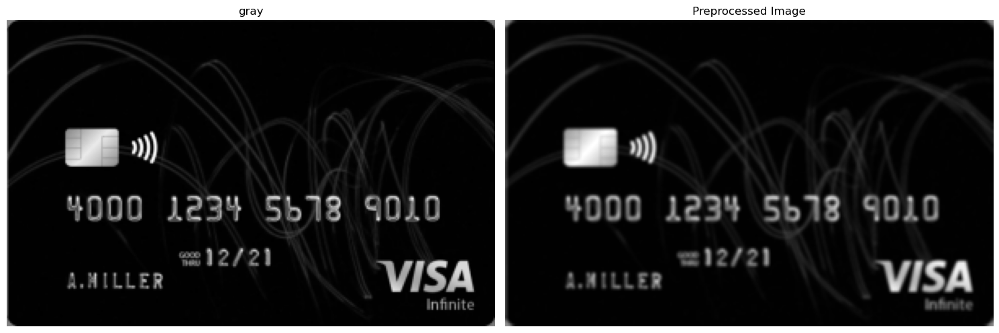

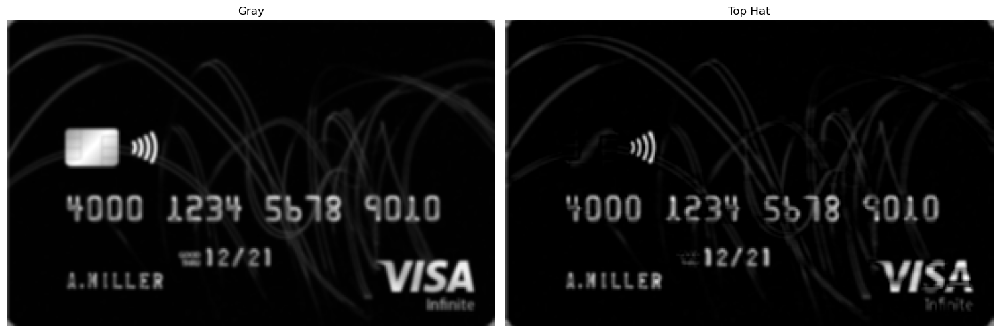

Credit Card Type: Visa
Credit Card #: 4000123456789010


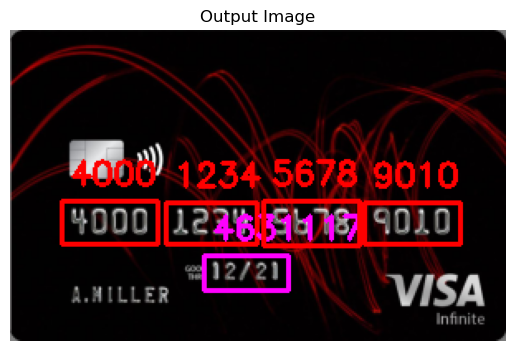

Test Case 2
No rotation detected


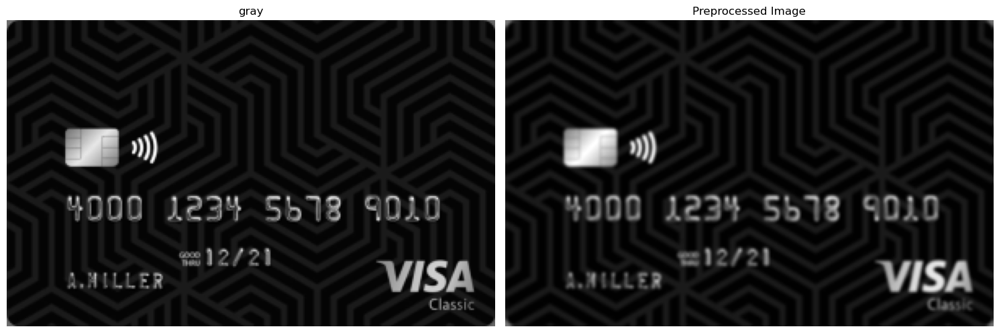

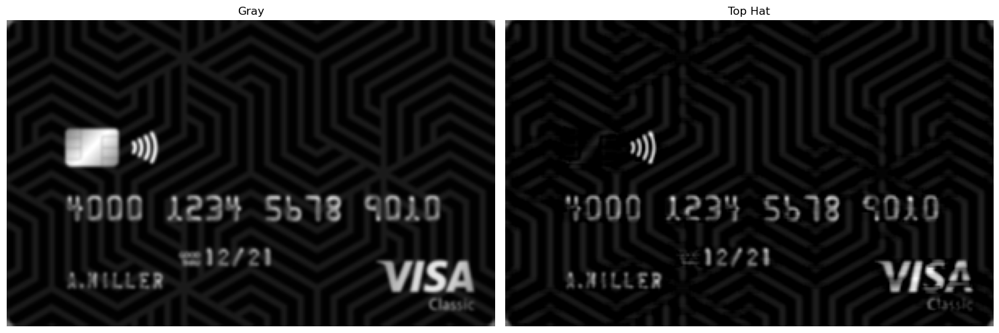

Credit Card Type: Visa
Credit Card #: 4000123456789010


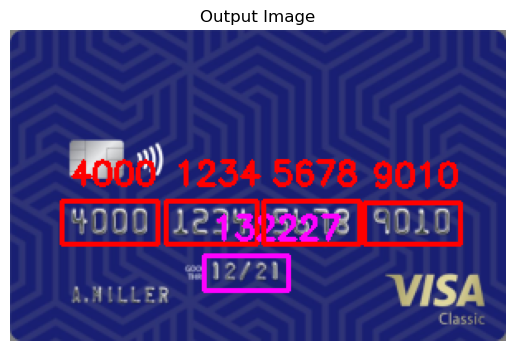

Test Case 3
No rotation detected


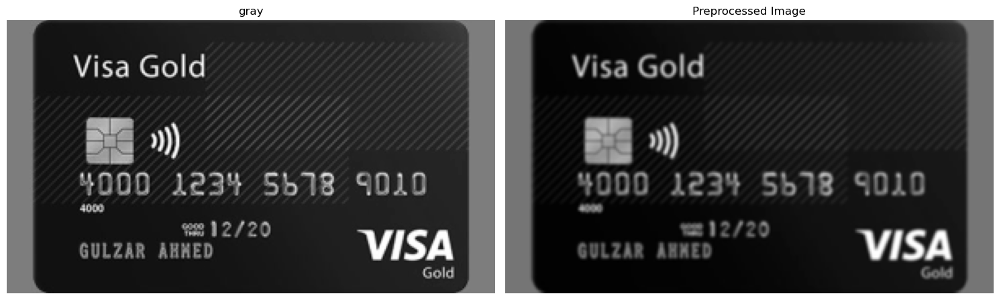

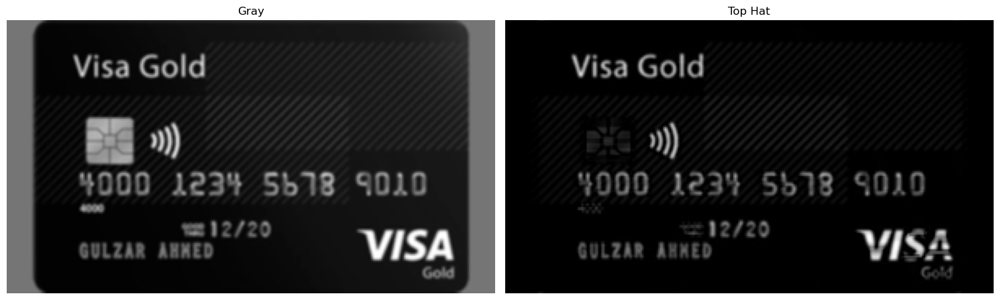

Credit Card Type: Visa
Credit Card #: 4000123456789010


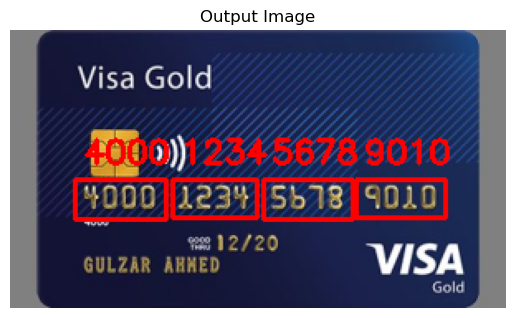

Test Case 4
No rotation detected


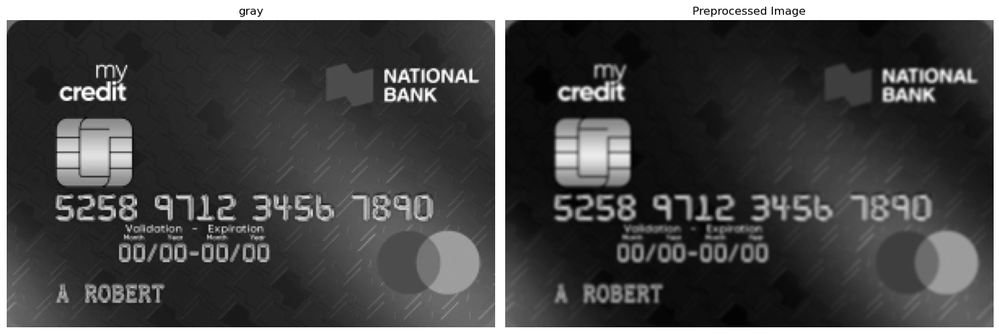

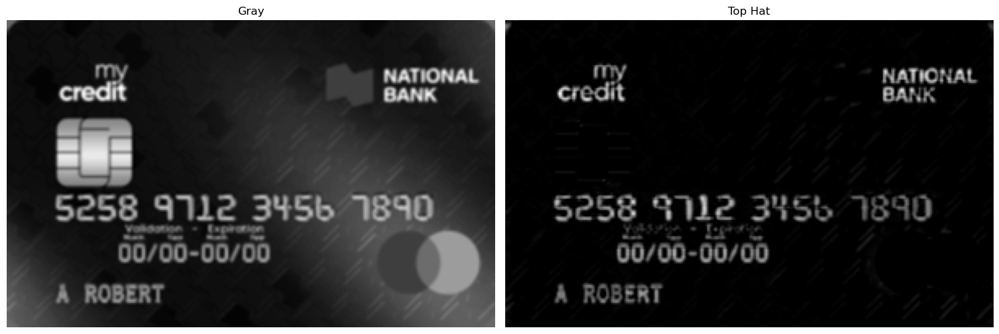

Credit Card Type: MasterCard
Credit Card #: 5258971234567890


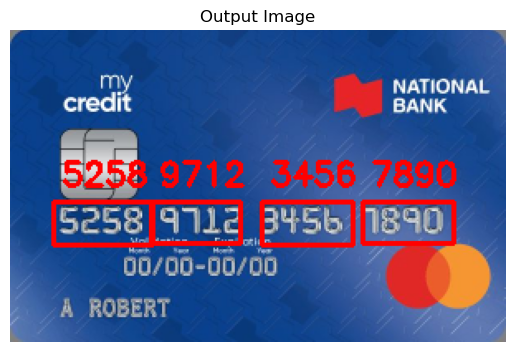

Test Case 5
No rotation detected


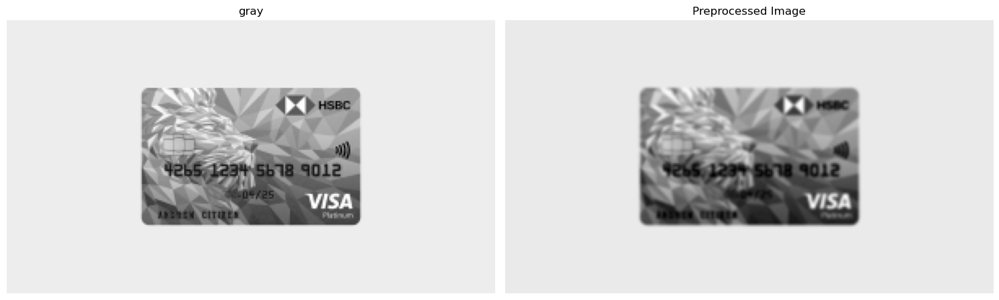

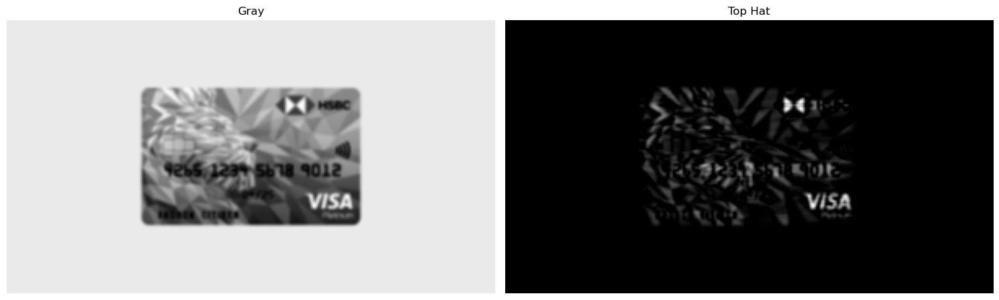

No credit card information found


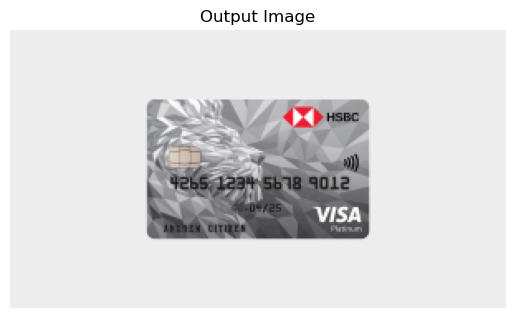

Test Case 6
Correcting rotation...


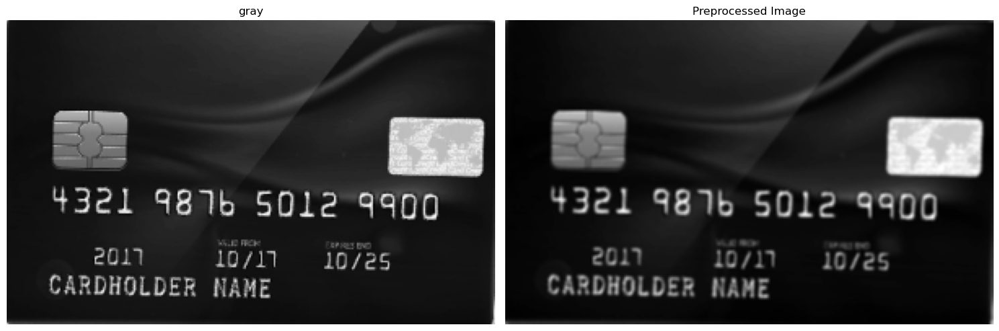

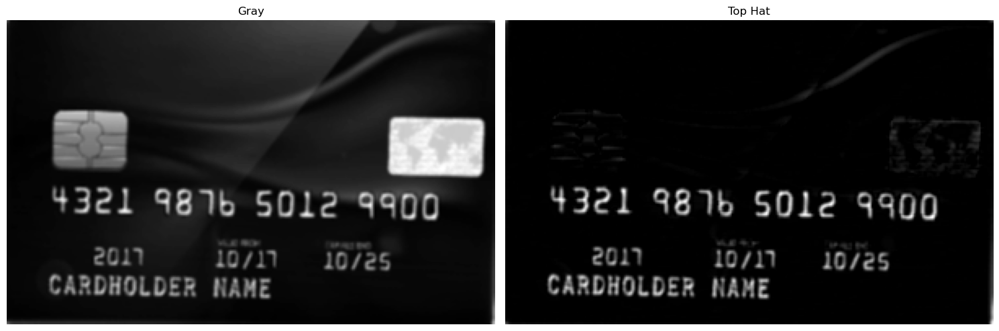

Credit Card Type: Visa
Credit Card #: 4321987650129900


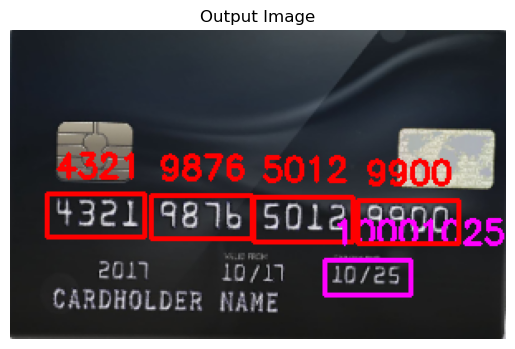

Test Case 7
No rotation detected


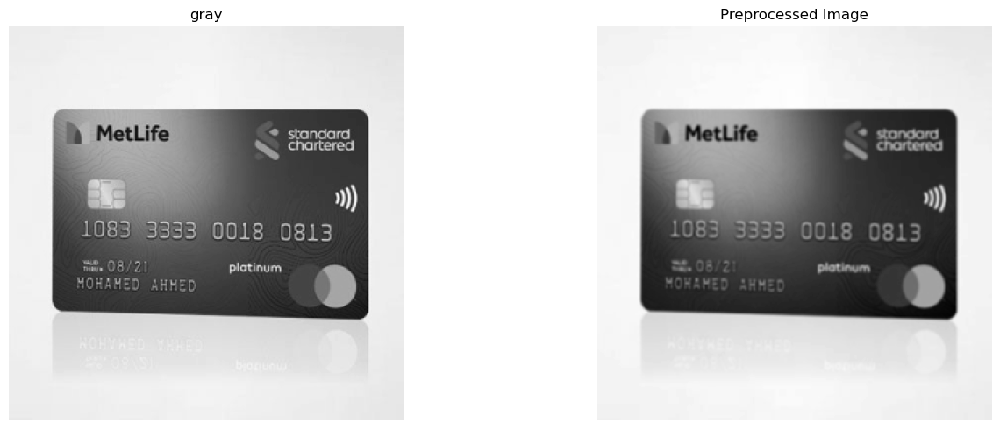

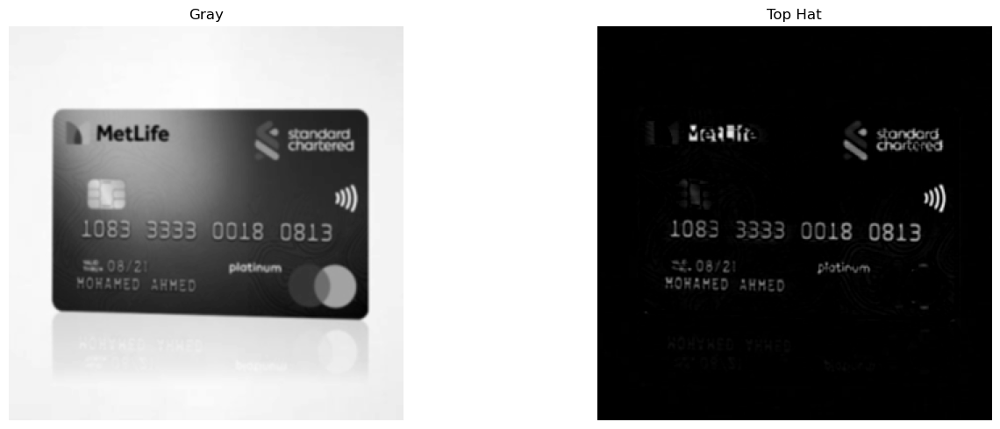

No credit card information found


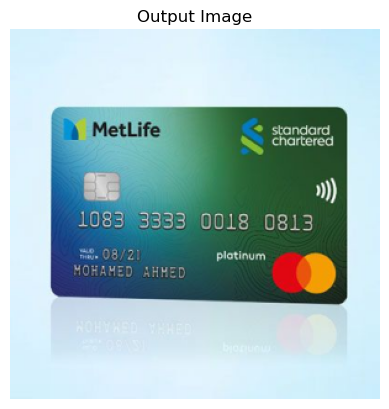

Test Case 8
No rotation detected


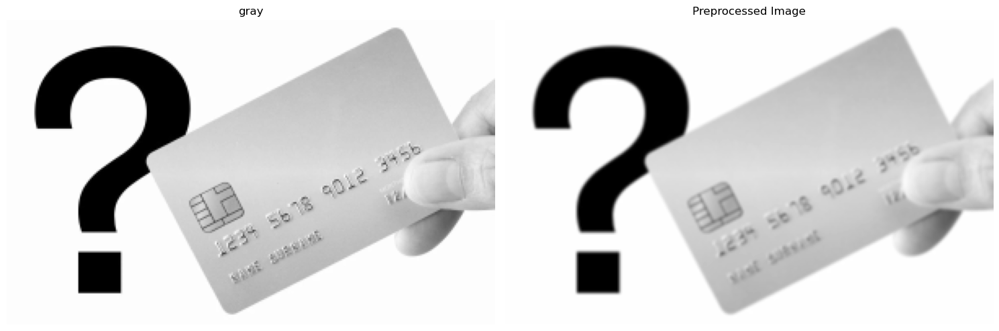

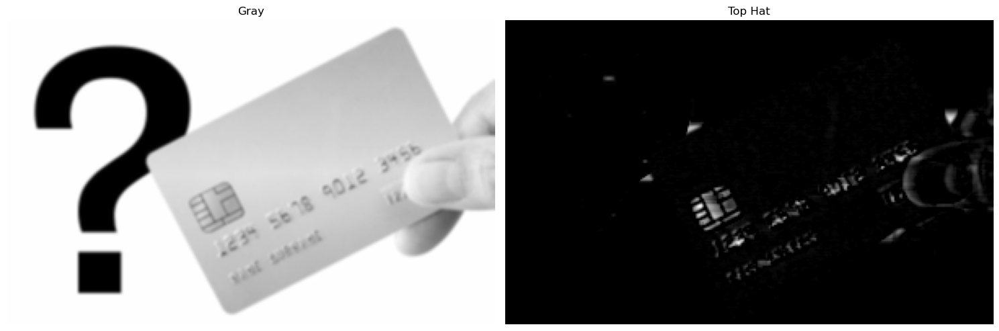

No credit card information found


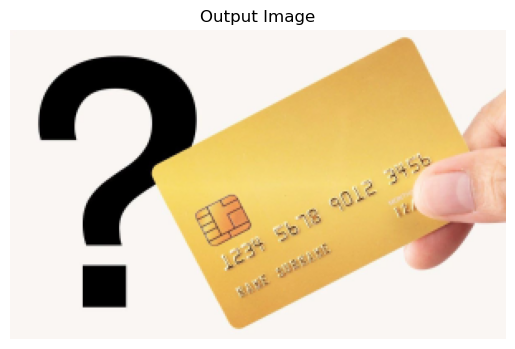

Test Case 9
No rotation detected


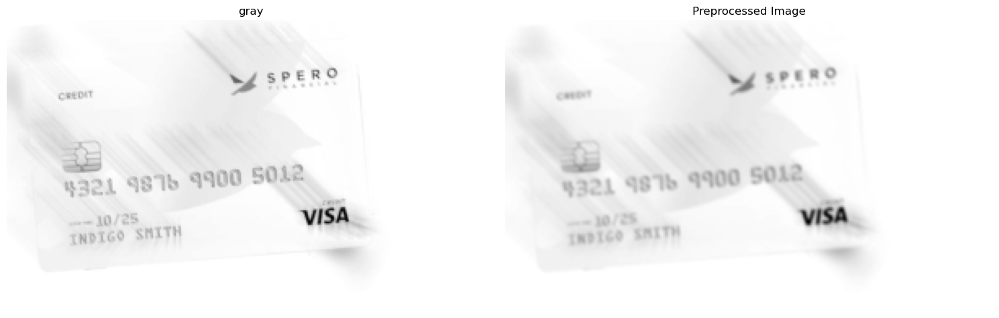

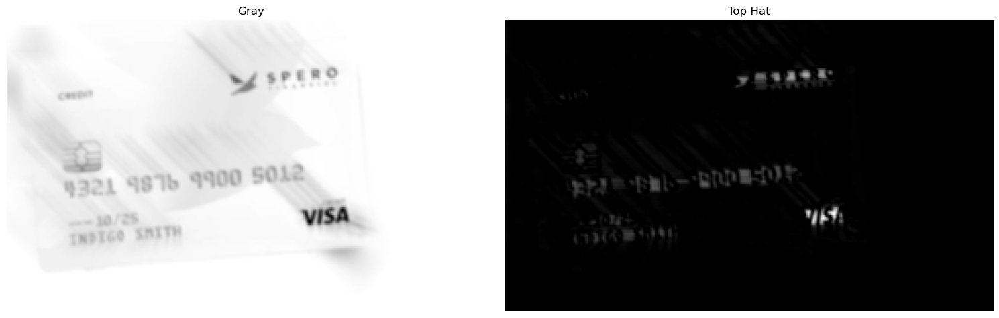

No credit card information found


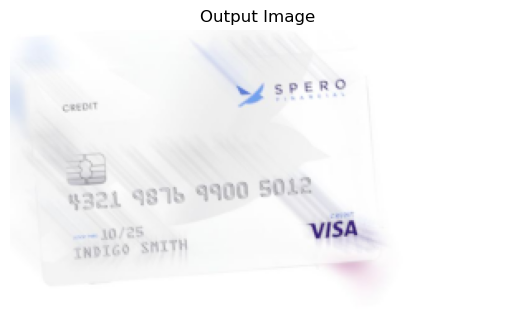

Test Case 10
No rotation detected


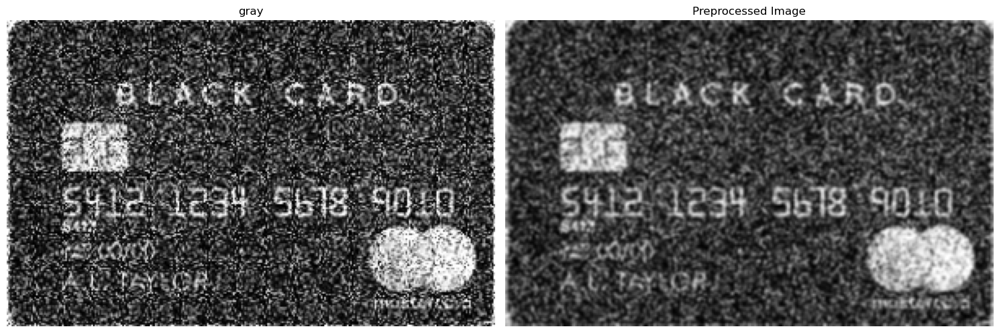

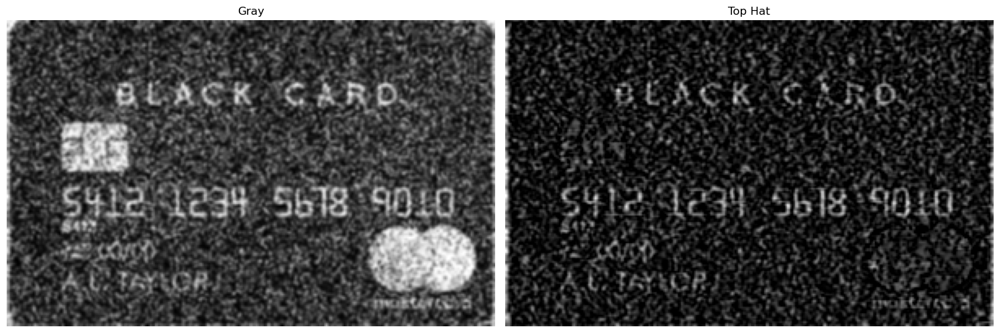

No credit card information found


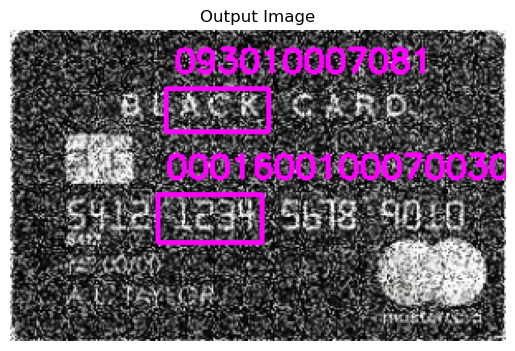

Test Case 11
No rotation detected


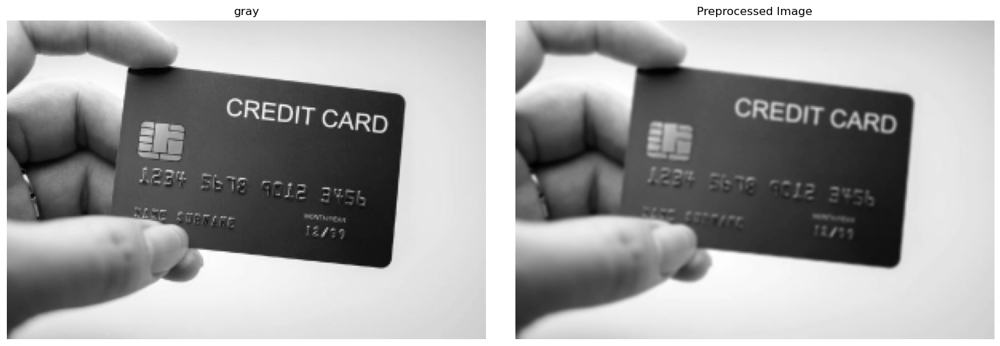

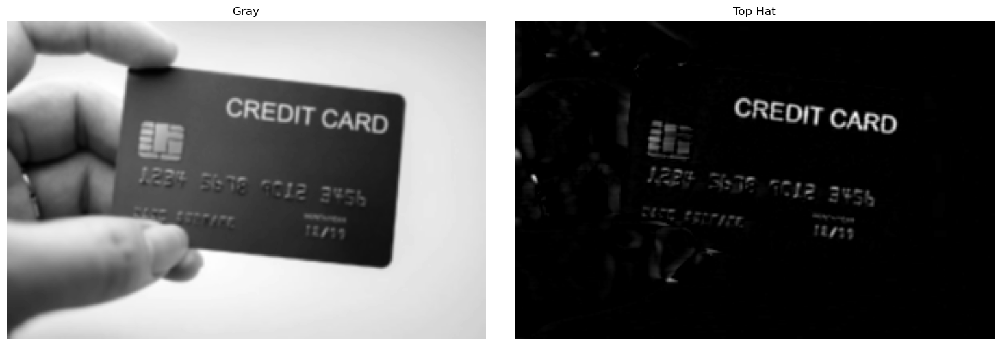

No credit card information found


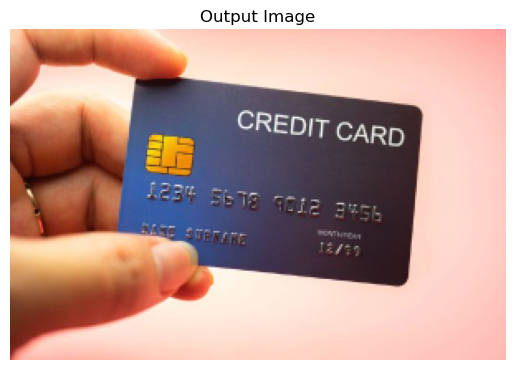

Test Case 12
No rotation detected


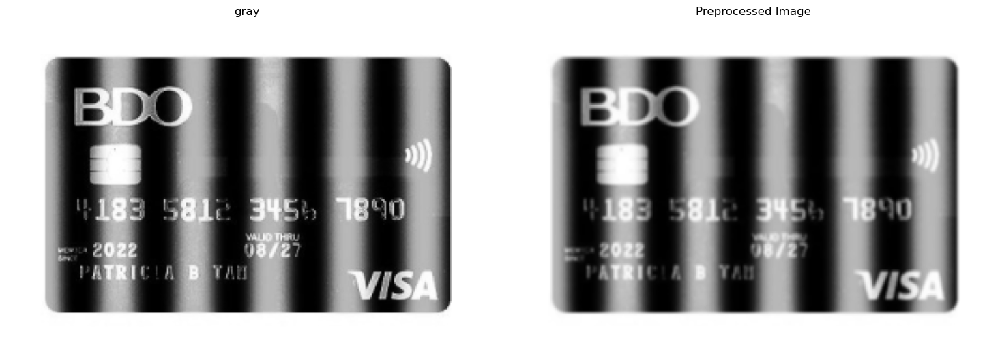

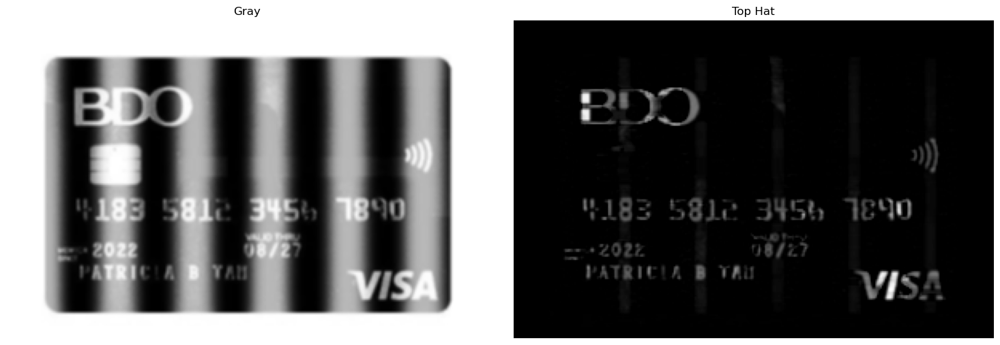

No credit card information found


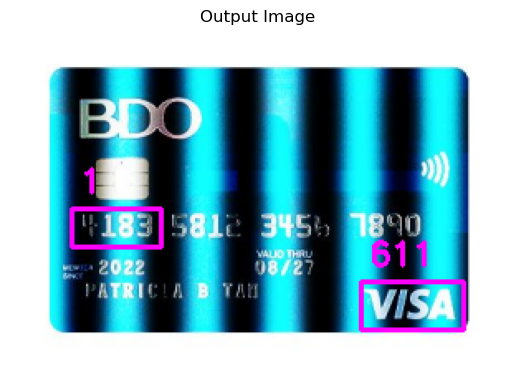

Test Case 13
Correcting rotation...


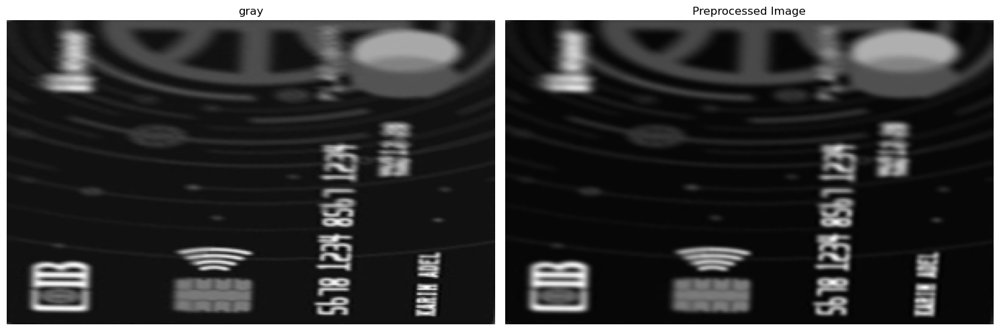

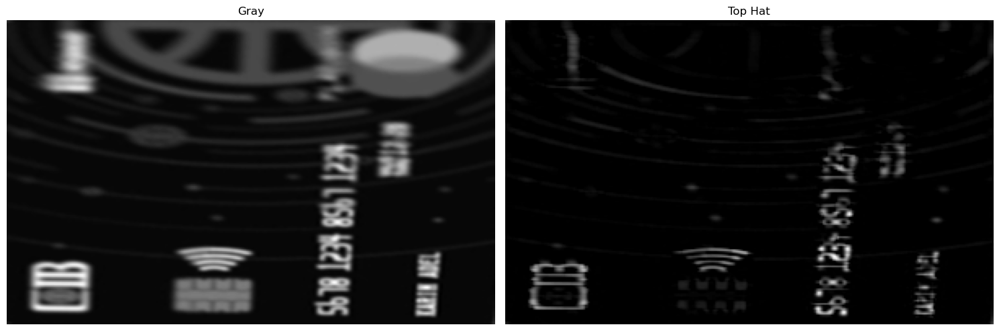

No credit card information found


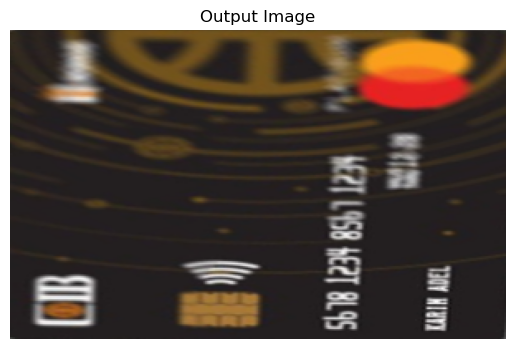

Test Case 14


UnboundLocalError: cannot access local variable 'card_corners' where it is not associated with a value

In [16]:
ref_image_path = 'ref/ocr_a_reference.png'
digits = load_digit_templates(ref_image_path)
for i in range(len(testcases)):
# for i in range(1):
    print(f'Test Case {i+1}')
    image = cv2.imread(testcases[i+1])

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges_output = cv2.Canny(gray, 50, 150, apertureSize=3)
    is_tilted, angle = Check_Rotation(edges_output)
    if is_tilted:
        print("Correcting rotation...")
        image = correct_rotation(edges_output, image)
    else:
        print("No rotation detected")
    
    
    image = imutils.resize(image, width=300) 
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    proceed_image = preprocess_image(gray)
    thresh = apply_morphological_operations(proceed_image)
    locs = find_digit_contours(thresh)
    output = recognize_digits(image, proceed_image, locs, digits, EXPECTED_PAN_DIGITS)

    display_results(output, image)

